### Name: Vinit Mehta
### Roll No: 2022111001

# Imports and Variables

In [19]:
# Imports and constants
import cv2
import numpy as np
import matplotlib.pyplot as plt

my_roll_number = 2022102059
a = my_roll_number % 10

colors = channels = ['red', 'green', 'blue']

img_names = ["A", "B"]
img_paths = ["./src_img/Lenna.png", "./src_img/image.jpg"]

# Q1

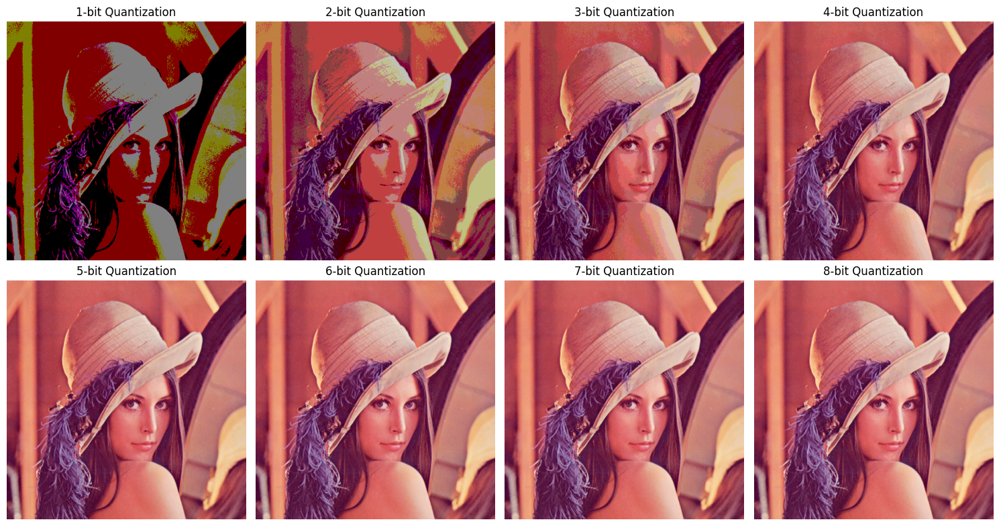

In [20]:
# Function takes in the image array as well as the number of bits (k) to quantise the image to
def quantise_img(img_arr, k):
    bit_mask = np.uint8(((2 ** k) - 1) * (2 ** (8 - k)))
    quantised_img = np.uint8(img_arr) & bit_mask
    return quantised_img

# Load Lenna Image
lenna_img_arr = cv2.imread('./src_img/Lenna.png')
lenna_img = cv2.cvtColor(lenna_img_arr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(2, 4, figsize=(15, 8))
axes = axes.flatten()

for k in range(8):
    quantised_img = quantise_img(lenna_img, k + 1)
    axes[k].imshow(quantised_img)
    axes[k].set_title(f'{k + 1}-bit Quantization')
    axes[k].axis('off')

plt.tight_layout()
plt.savefig("./out_img/quantisation.png")

## Explanation

As bit depth decreases, the number of possible colors reduces, leading to lower image quality, with effects like banding and loss of detail. Quantization reduces the number of distinct colors by decreasing the bits per pixel. Typically, images use 8 bits per color channel (Red, Green, Blue), allowing 256 levels per channel.

- 1-bit: Only 2 levels per channel, resulting in 8 colors—highly limited and pixelated.
- 2-bit: 4 levels per channel, offering 64 colors—still quite limited.
- 3-bit: 8 levels per channel, with 512 colors—noticeably better but still lacking.
- 4-bit: 16 levels per channel, providing 4096 colors—closer to the original, though some banding is visible.
Similarly goes for bits 5-8. Significant visual differences appear below 5 bits, with the most drastic changes seen at 4 bits and below. The image remains visually similar to the original up to 5 bits, with more noticeable degradation at lower bit depths. When we are performing quantisation we are just keeping the required number of MSB and dropping all the rest of the LSB to 0.

# Q2

## 2.1

In [21]:
# Takes an image input and returns individual channels of each image in the form of a list
def get_channels(img_arr):
    if len(img_arr.shape) > 3:
        raise ValueError("Image cannot have more than 3 channels")
    channels = list()
    if len(img_arr.shape) == 2:
        # It's already a single channel image
        channels.append(img_arr)
    else:
        # It's a multi-channel image
        channels = list()
        for i in range(img_arr.shape[2]):
            channels.append(img_arr[:, :, i])
    return channels

# Returns the histogram of image passed to it
def get_histogram(img_arr):
    '''
        Note if the image passed in has only 1 channel (grayscale), it will return the histogram for that 1 channel
        But if the image has 3 channels (RGB), it will return the sum histogram of all 3 channels
    '''
    hist = np.zeros(256)
    for i in range(256):
        hist[i] = np.sum(img_arr == i)
    return hist

# Takes input as an image and returns the equalised image as output
def histequalize(img_arr):
    hist = get_histogram(img_arr)
    cdf = np.cumsum(hist)
    min_val = np.min(cdf)
    max_val = np.max(cdf)
    normalised_cdf = np.int32(((cdf - min_val) / (max_val - min_val)) * 255)
    equalised_img = normalised_cdf[img_arr]
    return equalised_img

## 2.2

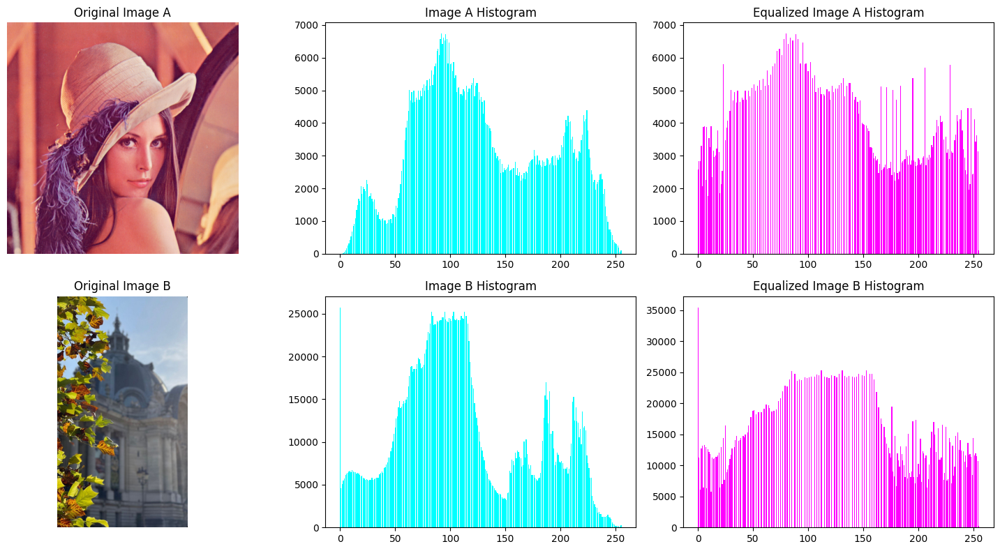

In [22]:
imgs = list()
for img_path in img_paths:
    img_arr = cv2.imread(img_path)
    img_arr = cv2.cvtColor(img_arr, cv2.COLOR_BGR2RGB)
    imgs.append(img_arr)

hist_imgs = list()
for img_arr in imgs:
    hist_imgs.append(get_histogram(img_arr))

eq_imgs_direct = list()
for img_arr in imgs:
    eq_imgs_direct.append(histequalize(img_arr))

eq_hist_imgs = list()
for eq_img_arr in eq_imgs_direct:
    eq_hist_imgs.append(get_histogram(eq_img_arr))

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for row in range(2):
    axes[row, 0].imshow(imgs[row])
    axes[row, 0].axis('off')
    axes[row, 0].set_title(f"Original Image {chr(65 + row)}")

    axes[row, 1].bar(np.arange(256), hist_imgs[row], color="cyan")
    axes[row, 1].set_title(f"Image {chr(65 + row)} Histogram")

    axes[row, 2].bar(np.arange(256), eq_hist_imgs[row], color="magenta")
    axes[row, 2].set_title(f"Equalized Image {chr(65 + row)} Histogram")

plt.tight_layout()
plt.savefig("./out_img/histogram_equalization.png")


This representation of the histogram for a colored image is effective in providing an overall view of the pixel intensity distribution across the entire image, regardless of individual color channels. It allows us to quickly identify which intensity levels are most prominent and observe how the distribution shifts after applying histogram equalization. While there are cases where examining each channel separately is important, this combined histogram offers a valuable summary of the overall intensity distribution in the image.

## 2.3

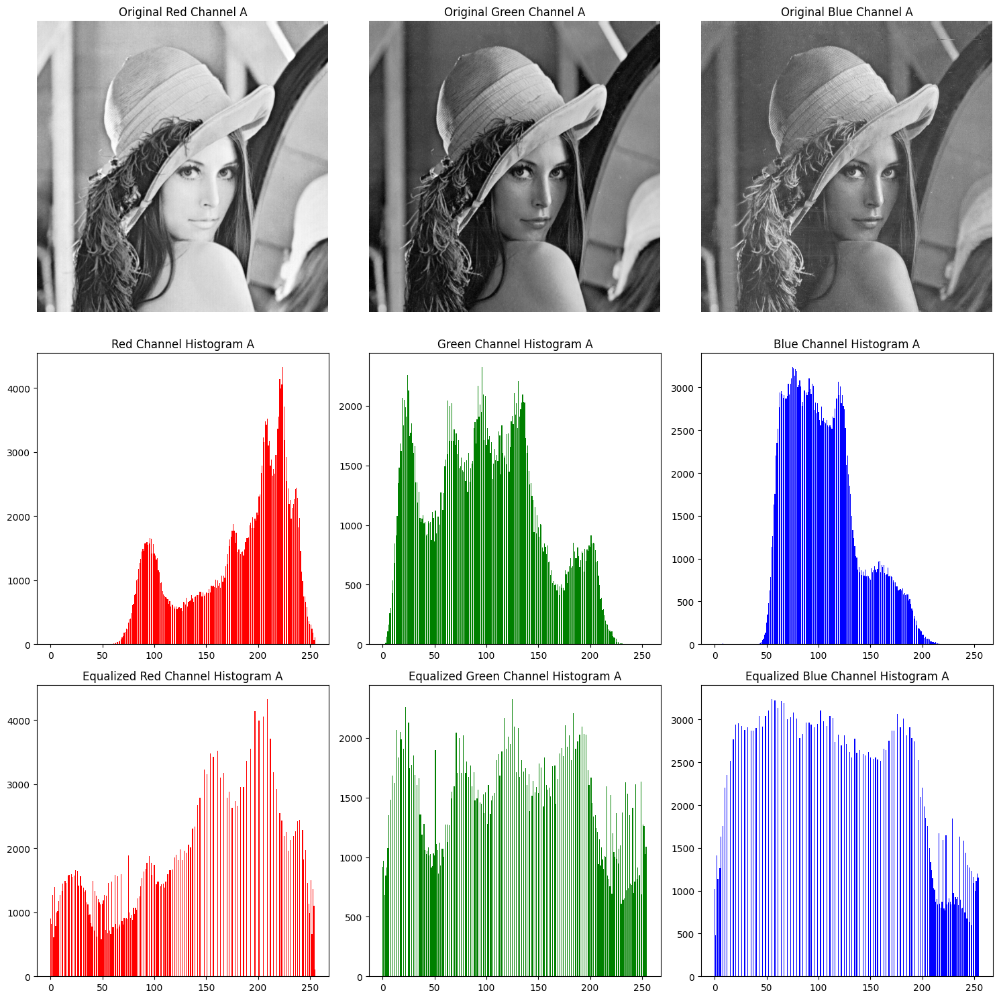

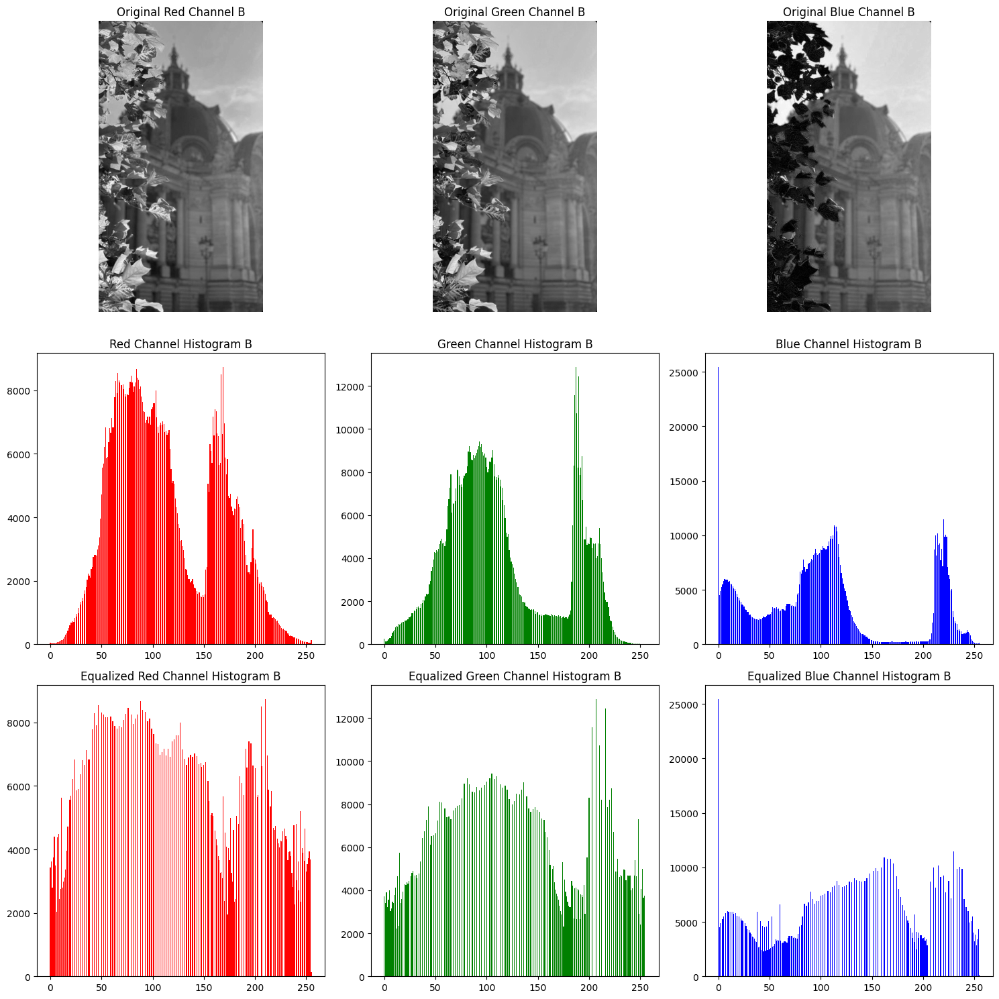

In [23]:
channelwise_imgs = list()
for img_arr in imgs:
    channels = get_channels(img_arr)
    channelwise_imgs.append(channels)

channelwise_hists = list()
for channeled_img_arr in channelwise_imgs:
    channelwise_hists.append([get_histogram(channel) for channel in channeled_img_arr])

channelwise_eq_imgs = list()
for channeled_img_arr in channelwise_imgs:
    channelwise_eq_imgs.append([histequalize(channel) for channel in channeled_img_arr])

channelwise_eq_hists = list()
for channeled_eq_img_arr in channelwise_eq_imgs:
    channelwise_eq_hists.append([get_histogram(channel) for channel in channeled_eq_img_arr])

for img_idx in range(len(imgs)):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    img_name = img_names[img_idx]
    for col_idx in range(len(channels)):
        axes[0, col_idx].imshow(channelwise_imgs[img_idx][col_idx], cmap='gray')
        axes[0, col_idx].axis('off')
        axes[0, col_idx].set_title(f"Original {colors[col_idx].capitalize()} Channel {img_name}")

        axes[1, col_idx].bar(np.arange(256), channelwise_hists[img_idx][col_idx], color=colors[col_idx])
        axes[1, col_idx].set_title(f"{colors[col_idx].capitalize()} Channel Histogram {img_name}")

        axes[2, col_idx].bar(np.arange(256), channelwise_eq_hists[img_idx][col_idx], color=colors[col_idx])
        axes[2, col_idx].set_title(f"Equalized {colors[col_idx].capitalize()} Channel Histogram {img_name}")

    plt.tight_layout()
    plt.savefig(f"./out_img/channelwise_histogram_equalization_{colors[col_idx]}.png")

## 2.4

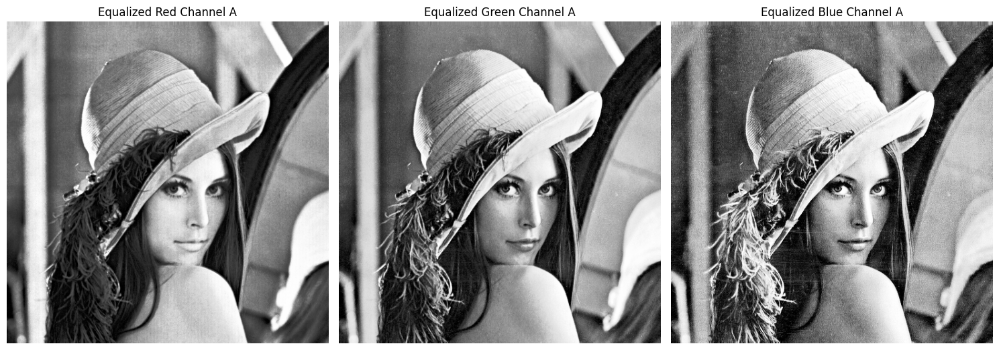

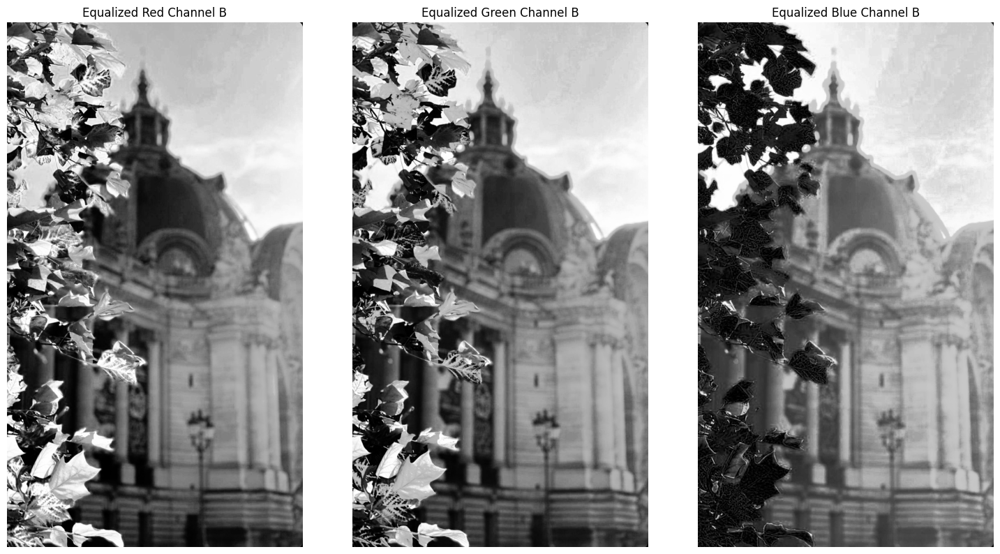

In [24]:
for img_idx in range(len(imgs)):
    fig, axes = plt.subplots(1, 3, figsize=(15, 8))
    img_name = img_names[img_idx]
    axes[0].imshow(channelwise_eq_imgs[img_idx][0], cmap='gray')
    axes[0].axis('off')
    axes[0].set_title(f"Equalized Red Channel {img_name}")

    axes[1].imshow(channelwise_eq_imgs[img_idx][1], cmap='gray')
    axes[1].axis('off')
    axes[1].set_title(f"Equalized Green Channel {img_name}")

    axes[2].imshow(channelwise_eq_imgs[img_idx][2], cmap='gray')
    axes[2].axis('off')
    axes[2].set_title(f"Equalized Blue Channel {img_name}")

    plt.tight_layout()
    plt.savefig(f"./out_img/equalized_images_{img_name}.png")

## 2.5

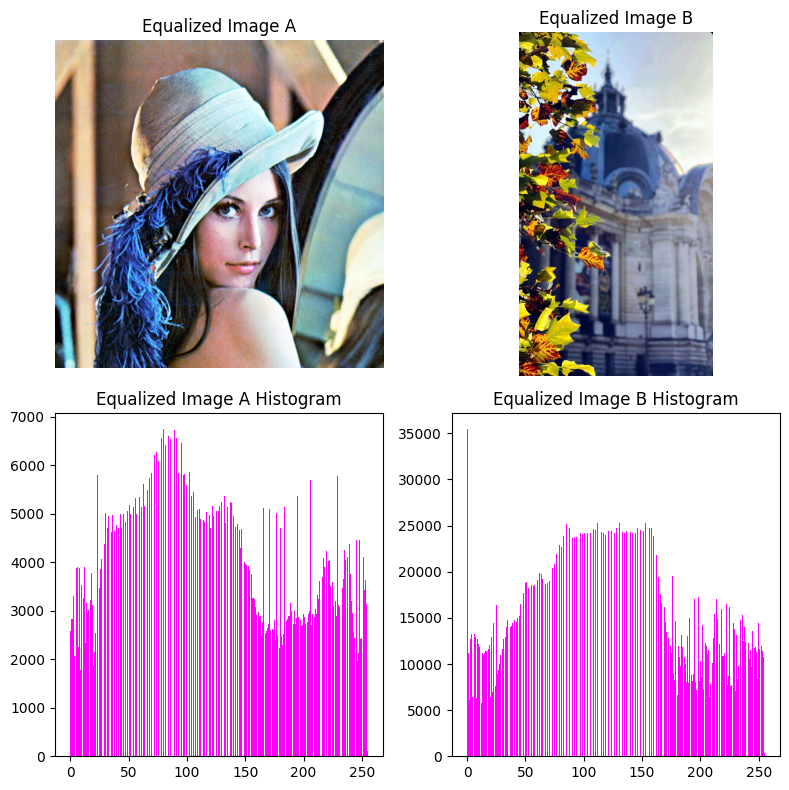

In [25]:
merged_imgs = [np.stack(channeled_eq_img_arr, axis=-1) for channeled_eq_img_arr in channelwise_eq_imgs]

merged_imgs_hists = list()
for merged_img in merged_imgs:
    merged_imgs_hists.append(get_histogram(merged_img))

fig, axes = plt.subplots(2, 2, figsize=(8, 8))

for img_idx in range(len(imgs)):
    img_name = img_names[img_idx]
    axes[0, img_idx].imshow(merged_imgs[img_idx])
    axes[0, img_idx].axis('off')
    axes[0, img_idx].set_title(f"Equalized Image {img_name}")

    axes[1, img_idx].bar(np.arange(256), eq_hist_imgs[img_idx], color='magenta')
    axes[1, img_idx].set_title(f"Equalized Image {img_name} Histogram")

plt.tight_layout()
plt.savefig("./out_img/histogram_equalization_combined.png")

## 2.6

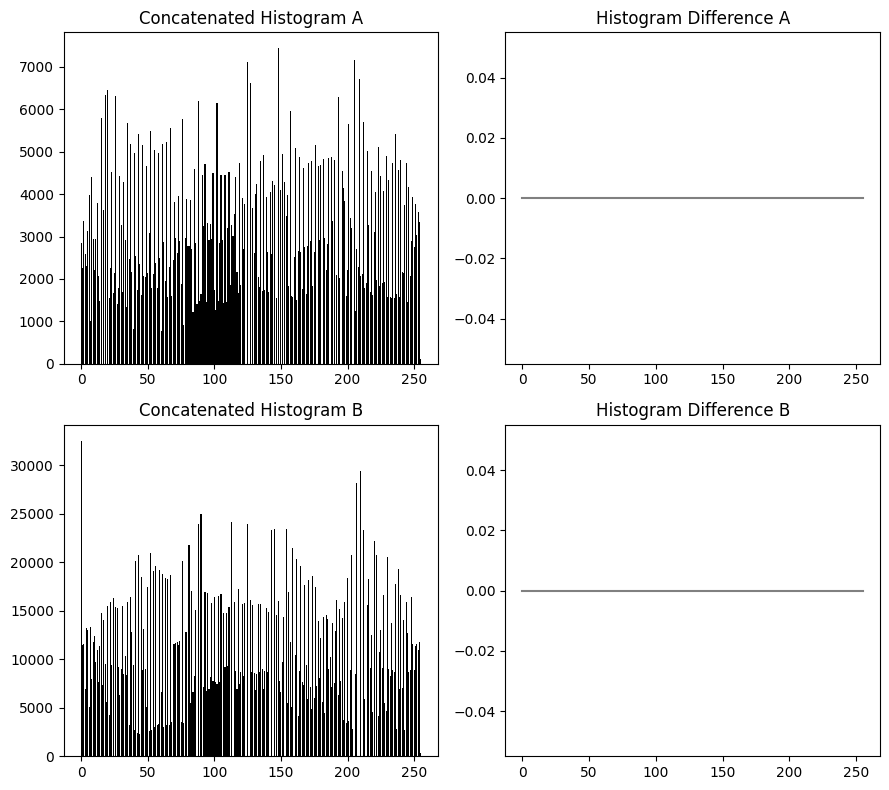

In [26]:
fig, axes = plt.subplots(2, 2, figsize=(9, 8))

concatenated_hists = list()
hists_difference = list()

for img_idx in range(len(imgs)):
    concatenated_hist = np.zeros(256)
    for channel_eq_hist in channelwise_eq_hists[img_idx]:
        concatenated_hist += channel_eq_hist
    concatenated_hists.append(concatenated_hist)
    hists_difference.append(concatenated_hist - merged_imgs_hists[img_idx])

    axes[img_idx, 0].bar(np.arange(256), concatenated_hist, color='black')
    axes[img_idx, 0].set_title(f"Concatenated Histogram {img_names[img_idx]}")

    axes[img_idx, 1].plot(np.arange(256), hists_difference[img_idx], color='gray')
    axes[img_idx, 1].set_title(f"Histogram Difference {img_names[img_idx]}")

plt.tight_layout()
plt.savefig("./out_img/concatenated_histograms.png")

## 2.7

After histogram equalization, the histogram appears more uniform, enhancing image details. However, independent equalization of RGB channels can distort colors. Despite this, the final image histogram looks the same whether you equalise channels individually then then concatenate them or merge the equalised images and then find the histogram.

# Q3

## 3.1

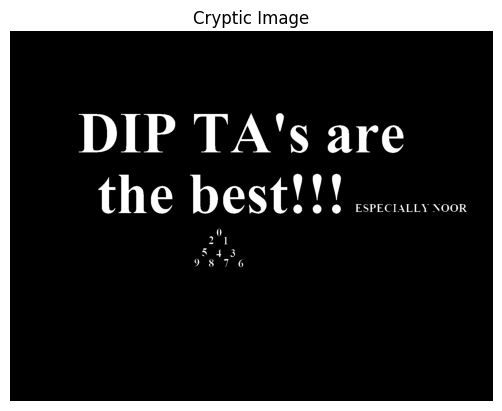

In [27]:
image_path = f"./src_img/{a}_mod.png"

img_arr = cv2.imread(image_path)
img_arr = cv2.cvtColor(img_arr, cv2.COLOR_BGR2RGB)
# To left-shift LSB to MSB
# decrypted_img_arr = np.uint32((img_arr & 0b00000001)) << 7

# To scale the pixel value to 255
decrypted_img_arr = np.uint32((img_arr & 0b00000001)) * 255
decrypted_img_arr = np.uint8(decrypted_img_arr)

plt.imshow(decrypted_img_arr)
plt.axis('off')
plt.title("Cryptic Image")
plt.savefig(f"./out_img/decrypted_img_{a}_mod.png")

## 3.2

DIP TAs are the best. Especially Noor.

## 3.3

The cryptic image looks weirdly proportioned because the base image was resized to match the dimensions of the hidden message image. Since the base image and message image originally had different proportions, resizing caused the distortion. This resizing was necessary to ensure the hidden message fit perfectly within the base image's LSB plane.

## 3.4

The cryptic image was created by first converting the message image to 1-bit per channel using quantization. Then, this 1-bit image was hidden in the least significant bit (LSB) of the base image. Since the LSB doesn't significantly affect the appearance of the base image, the hidden message remains invisible to the human eye, while the base image looks unchanged. Note that we quantise each channel individually and then replace each channel's LSB in base image to that of the quantised bit of the message image for respective channel.

## 3.5

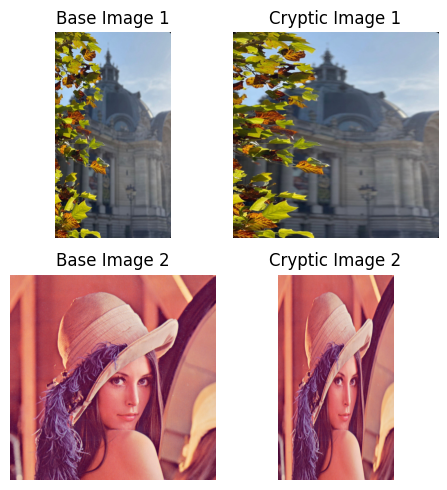

In [28]:

def crypt(base_img_arr, msg_img_arr):
    height, width = msg_img_arr.shape[:2]
    base_img_arr = cv2.resize(base_img_arr, (width, height), interpolation=cv2.INTER_AREA)

    # Retaining the MSB and shifting it to LSB to store
    quantised_msg_img_arr = quantise_img(msg_img_arr, 1)
    quantised_msg_img_arr = quantised_msg_img_arr >> 7

    first_part = np.uint8(base_img_arr) & 0b11111110
    second_part = np.uint8(quantised_msg_img_arr) & 0b00000001
    cryptic_img_arr = first_part | second_part
    return cryptic_img_arr

img1_arr = imgs[0]
img2_arr = imgs[1]

final_masked_img1 = crypt(img2_arr, img1_arr)
final_masked_img2 = crypt(img1_arr, img2_arr)

fig, axes = plt.subplots(2, 2, figsize=(5, 5))
axes[0, 0].imshow(img2_arr)
axes[0, 0].axis('off')
axes[0, 0].set_title("Base Image 1")

axes[0, 1].imshow(final_masked_img1)
axes[0, 1].axis('off')
axes[0, 1].set_title("Cryptic Image 1")

axes[1, 0].imshow(img1_arr)
axes[1, 0].axis('off')
axes[1, 0].set_title("Base Image 2")

axes[1, 1].imshow(final_masked_img2)
axes[1, 1].axis('off')
axes[1, 1].set_title("Cryptic Image 2")

plt.tight_layout()
plt.savefig("./out_img/encrypted_images_A_B.png")

## 3.6

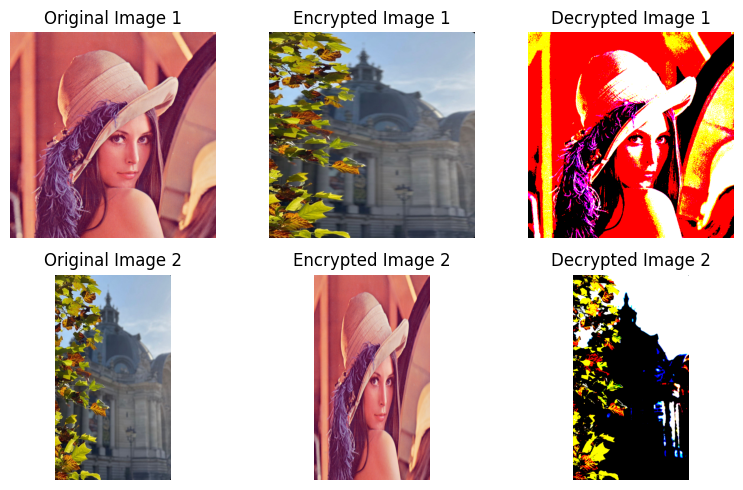

In [29]:
def decrypt(img_arr):
    # To left shift the LSB to MSB
    # decrypted_img_arr = np.uint32((np.uint8(img_arr) & 0b00000001)) << 7

    # To scale the pixel value to 255
    decrypted_img_arr = np.uint32((np.uint8(img_arr) & 0b00000001)) * 255
    return np.uint8(decrypted_img_arr)

decrypted_img_arr1 = decrypt(final_masked_img1)
decrypted_img_arr2 = decrypt(final_masked_img2)

fig, axes = plt.subplots(2, 3, figsize=(8, 5))

axes[0, 0].imshow(img1_arr)
axes[0, 0].axis('off')
axes[0, 0].set_title("Original Image 1")

axes[0, 1].imshow(final_masked_img1)
axes[0, 1].axis('off')
axes[0, 1].set_title("Encrypted Image 1")

axes[0, 2].imshow(decrypted_img_arr1)
axes[0, 2].axis('off')
axes[0, 2].set_title("Decrypted Image 1")

axes[1, 0].imshow(img2_arr)
axes[1, 0].axis('off')
axes[1, 0].set_title("Original Image 2")

axes[1, 1].imshow(final_masked_img2)
axes[1, 1].axis('off')
axes[1, 1].set_title("Encrypted Image 2")

axes[1, 2].imshow(decrypted_img_arr2)
axes[1, 2].axis('off')
axes[1, 2].set_title("Decrypted Image 2")

plt.tight_layout()
plt.savefig("./out_img/decrypted_images_A_B.png")

# Q4

## 4.1

/var/folders/mg/72d5zrx13_v4t4jnbv720xkm0000gn/T/ipykernel_65031/1088134178.py:20: RuntimeWarning: divide by zero encountered in floor_divide
  (a // green_channel) + 8


True

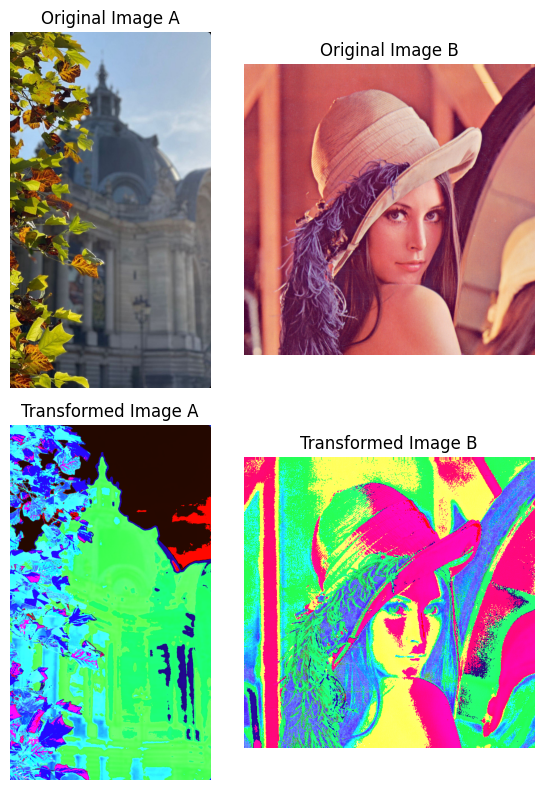

In [30]:
def piecewise_linear_transformation(img_arr, a):
    transformed_img = np.zeros(img_arr.shape)
    red_channel = np.uint32(img_arr[:, :, 0])
    green_channel = np.uint32(img_arr[:, :, 1])
    blue_channel = np.uint32(img_arr[:, :, 2])

    transformed_red = np.where(
        red_channel <= 100,
        red_channel + a,
        np.where(
            red_channel <= 200,
            (red_channel // a) + (2 * a),
            255
        )
    )

    transformed_green = np.where(
        green_channel <= 128,
        (5 * green_channel) + 1,
        (a // green_channel) + 8
    )

    transformed_blue = np.where(
        blue_channel <= 75,
        255,
        np.where(
            blue_channel <= 200,
            blue_channel,
            0
        )
    )

    transformed_img[:, :, 0] = np.clip(transformed_red, 0, 255)
    transformed_img[:, :, 1] = np.clip(transformed_green, 0, 255)
    transformed_img[:, :, 2] = np.clip(transformed_blue, 0, 255)
    return np.uint8(transformed_img)

img_A_path = "./src_img/image.jpg"
img_B_path = "./src_img/Lenna.png"

img_A = cv2.imread(img_A_path)
img_B = cv2.imread(img_B_path)

img_A = cv2.cvtColor(img_A, cv2.COLOR_BGR2RGB)
img_B = cv2.cvtColor(img_B, cv2.COLOR_BGR2RGB)

transformed_img_A = piecewise_linear_transformation(img_A, a)
transformed_img_B = piecewise_linear_transformation(img_B, a)

fig, axes = plt.subplots(2, 2, figsize=(6, 8))
axes[0, 0].imshow(img_A)
axes[0, 0].axis('off')
axes[0, 0].set_title("Original Image A")

axes[0, 1].imshow(img_B)
axes[0, 1].axis('off')
axes[0, 1].set_title("Original Image B")

axes[1, 0].imshow(transformed_img_A)
axes[1, 0].axis('off')
axes[1, 0].set_title("Transformed Image A")

axes[1, 1].imshow(transformed_img_B)    
axes[1, 1].axis('off')
axes[1, 1].set_title("Transformed Image B")

plt.tight_layout()
plt.savefig("./out_img/piecewise_linearly_transformed_A_B.png")
cv2.imwrite(f"./out_img/transformed_image_A.png", cv2.cvtColor(transformed_img_A, cv2.COLOR_RGB2BGR))
cv2.imwrite(f"./out_img/transformed_image_B.png", cv2.cvtColor(transformed_img_B, cv2.COLOR_RGB2BGR))

In [31]:
# Linear Regression Model
class Linreg:
    def __init__(self, X, Y, lr, epochs):
        self.X = np.int32(X)
        self.Y = np.int32(Y)
        self.lr = lr
        self.epochs = epochs
        self.m = 0
        self.c = 0
    
    def fit(self):
        x = self.X
        y = self.Y
        m = self.m
        c = self.c
        lr = self.lr
        for _ in range(self.epochs):
            y_pred = (m * x) + c
            err = y_pred - y
            D_m = 2 * np.average(x * err)
            D_c = 2 * np.average(err)
            m -= lr * D_m
            c -= lr * D_c
        self.m = m
        self.c = c

    def get_params(self):
        return self.m, self.c

## 4.2

/var/folders/mg/72d5zrx13_v4t4jnbv720xkm0000gn/T/ipykernel_65031/1088134178.py:20: RuntimeWarning: divide by zero encountered in floor_divide
  (a // green_channel) + 8


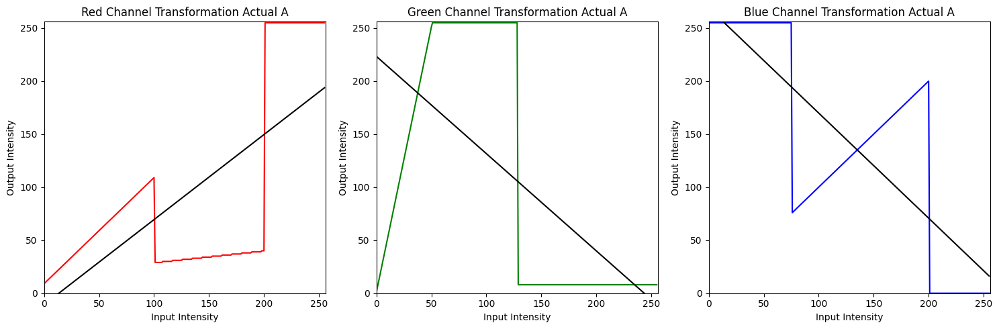

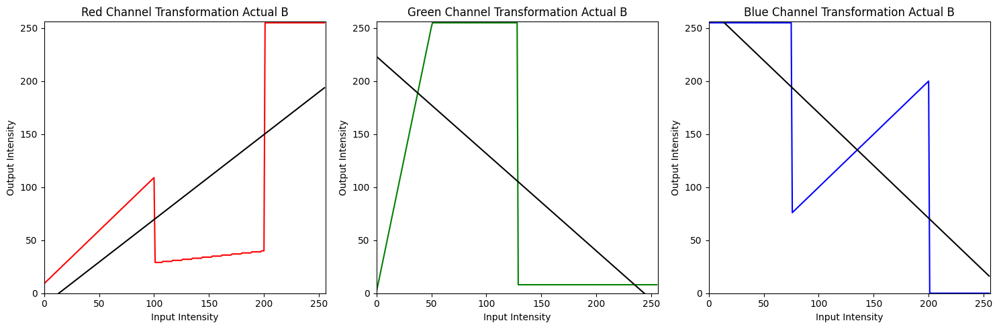

In [32]:
def flatten_img(img_arr, transformed_img_arr):
    flattened_x = np.int32(np.array([img_arr[:, :, i].flatten() for i in range(3)]))
    flattened_y = np.int32(np.array([transformed_img_arr[:, :, i].flatten() for i in range(3)]))

    new_flattened_x = []
    new_flattened_y = []

    for i in range(3):
        unique_indices = np.unique(flattened_x[i], return_index=True)[1]
        new_flattened_x.append(flattened_x[i][unique_indices])
        new_flattened_y.append(flattened_y[i][unique_indices])

    return new_flattened_x, new_flattened_y

def plot_graph(axis, m, c, flattened_x, flattened_y, color, plot_type="scatter", img=""):
    X = np.array([0, 255])
    Y = m * X + c
    if plot_type == "scatter":
        axis.scatter(flattened_x, flattened_y, color=color)
    elif plot_type == "line":
        axis.plot(flattened_x, flattened_y, color=color)
    axis.plot(X, Y, color='black')
    axis.set_xlim(0, 256)
    axis.set_ylim(0, 256)
    axis.set_title(f"{color.capitalize()} Channel Transformation {img}")
    axis.set_xlabel("Input Intensity")
    axis.set_ylabel("Output Intensity")

def q_4_2(flattened_x, flattened_y, plot_type="scatter", img=""):
    colors = ['red', 'green', 'blue']
    final_params = []
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i in range(3):
        linreg = Linreg(flattened_x[i], flattened_y[i], 0.00002, 500000)
        linreg.fit()
        m, c = linreg.get_params()
        final_params.append((m, c))
        plot_graph(axes[i], m, c, flattened_x[i], flattened_y[i], colors[i], plot_type, img)
        
    plt.tight_layout()
    return final_params

for img_idx in range(len(imgs)):
    img_name = img_names[img_idx]
    sample_arr = np.array([[[i, i, i] for i in range(0, 256)]])
    transformed_sample_arr = piecewise_linear_transformation(sample_arr, a)

    flatten_x_sample, flatten_y_sample = flatten_img(sample_arr, transformed_sample_arr)
    best_fit_params_sample = q_4_2(flatten_x_sample, flatten_y_sample, "line", f"Actual {img_name}")
    plt.savefig("./out_img/original_linear_transform_and_best_fit.png")

## 4.3

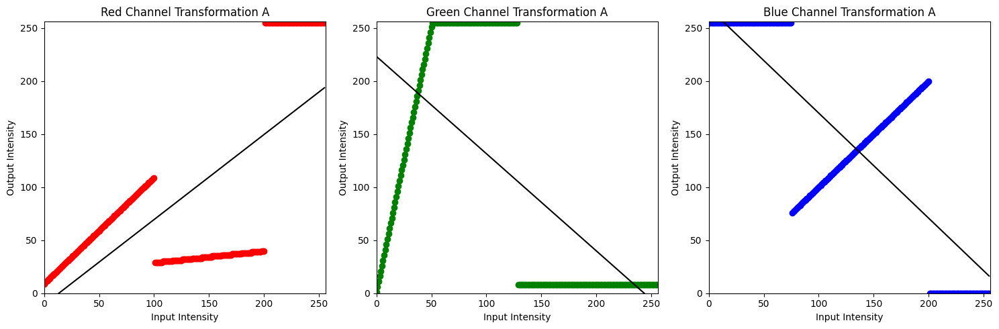

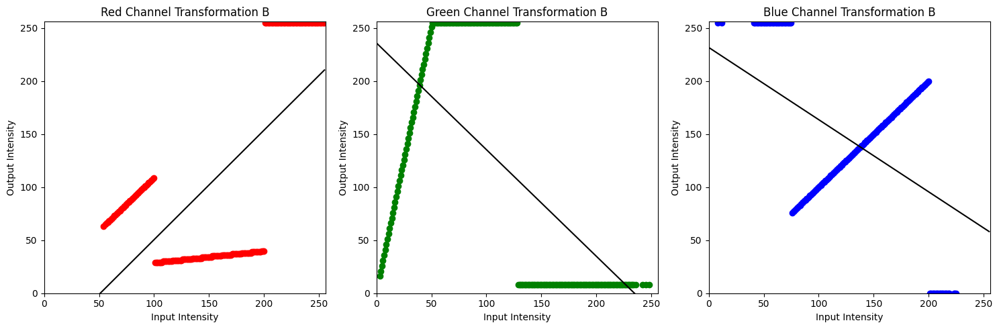

In [33]:
transformed_img_A = cv2.imread("./out_img/transformed_image_A.png")
transformed_img_B = cv2.imread("./out_img/transformed_image_B.png")

transformed_img_A = cv2.cvtColor(transformed_img_A, cv2.COLOR_BGR2RGB)
transformed_img_B = cv2.cvtColor(transformed_img_B, cv2.COLOR_BGR2RGB)

flatten_x_A, flatten_y_A = flatten_img(img_A, transformed_img_A)
flatten_x_B, flatten_y_B = flatten_img(img_B, transformed_img_B)

best_fit_params_A = q_4_2(flatten_x_A, flatten_y_A, "scatter", "A")
plt.savefig("./out_img/transform_and_best_fit_A.png")
best_fit_params_B = q_4_2(flatten_x_B, flatten_y_B, "scatter", "B")
plt.savefig("./out_img/transform_and_best_fit_B.png")

## Explanation

The red channel's best fit line has a positive slope, which aligns with the given piecewise linear transformation. For the green and blue channels, the best fit lines have negative slopes because lower values are mapped to higher ones, and higher values to lower ones, according to the transformation with `a = 1`. This clearly reflects the overall trend in how the channels were transformed.

## 4.4

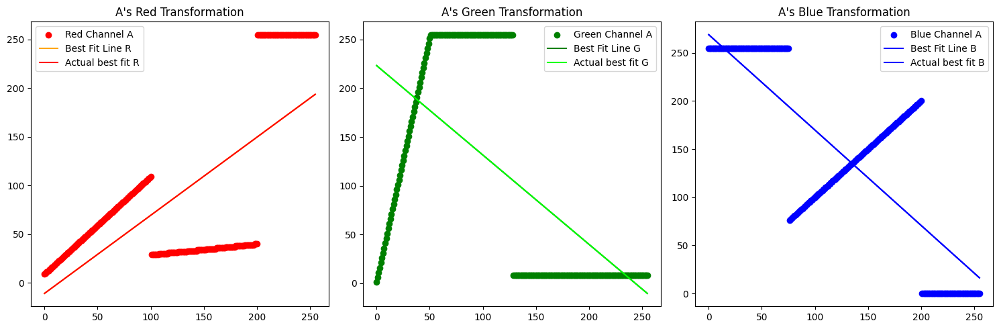

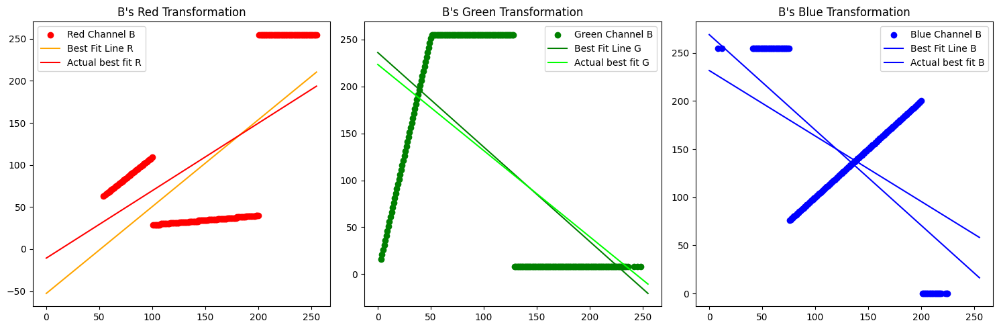

In [34]:
sample_best_fit_line_colors = ['#FF0000', '#00FF00', '#0000FF']
best_fit_line_colors = ['#FFA500', '#008000', '#0000FF']
channels = ['R', 'G', 'B']

def plot_all_graphs(axis, flatten_x, flatten_y, img):
    axis[0].scatter(flatten_x[0], flatten_y[0], color='red', label=f'Red Channel {img}')
    axis[0].set_title(f"{img}'s Red Transformation")

    axis[1].scatter(flatten_x[1], flatten_y[1], color='green', label=f'Green Channel {img}')
    axis[1].set_title(f"{img}'s Green Transformation")

    axis[2].scatter(flatten_x[2], flatten_y[2], color='blue', label=f'Blue Channel {img}')
    axis[2].set_title(f"{img}'s Blue Transformation")

    if img == "A":
        best_fit_params = best_fit_params_A
    else:
        best_fit_params = best_fit_params_B

    X = np.array([0, 255])
    for i in range(3):
        m, c = best_fit_params[i]
        Y = m * X + c
        axis[i].plot(X, Y, color=best_fit_line_colors[i], label=f'Best Fit Line {channels[i]}')

        m, c = best_fit_params_sample[i]
        Y = m * X + c
        axis[i].plot(X, Y, color=sample_best_fit_line_colors[i], label=f'Actual best fit {channels[i]}')

    axis[0].legend()
    axis[1].legend()
    axis[2].legend()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
plot_all_graphs(axes, flatten_x_A, flatten_y_A, "A")
plt.tight_layout()
plt.savefig("./out_img/all_in_one_A.png")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
plot_all_graphs(axes, flatten_x_B, flatten_y_B, "B")
plt.tight_layout()
plt.savefig("./out_img/all_in_one_B.png")

In Image A, the best fit lines overlap since all intensity values are present across all channels. In contrast, Image B has missing intensity values, causing the best fit line to deviate from the actual transformation function's best fit line.

## 4.5

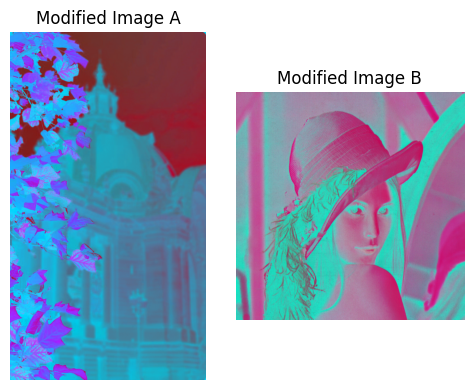

In [35]:
def mod_trans(img_arr, img):
    if img == "A":
        best_fit_params = best_fit_params_A
    else:
        best_fit_params = best_fit_params_B

    transformed_img_arr = np.zeros(img_arr.shape)

    for i in range(3):
        m, c = best_fit_params[i]
        transformed_img_arr[:, :, i] = np.clip((m * img_arr[:, :, i]) + c, 0, 255)
    return np.uint8(transformed_img_arr)

mod_A = mod_trans(img_A, "A")
mod_B = mod_trans(img_B, "B")

fig, axes = plt.subplots(1, 2, figsize=(5, 4))
axes[0].imshow(mod_A)
axes[0].axis('off')
axes[0].set_title("Modified Image A")

axes[1].imshow(mod_B)
axes[1].axis('off')
axes[1].set_title("Modified Image B")

plt.tight_layout()
plt.savefig("./out_img/modified_images_A_B.png")

## 4.6

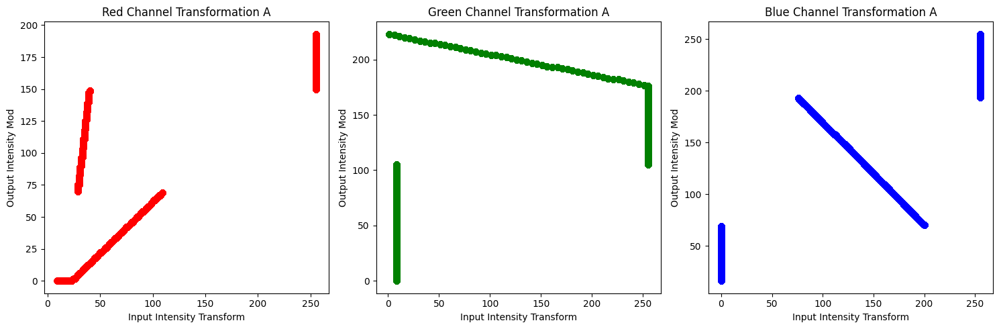

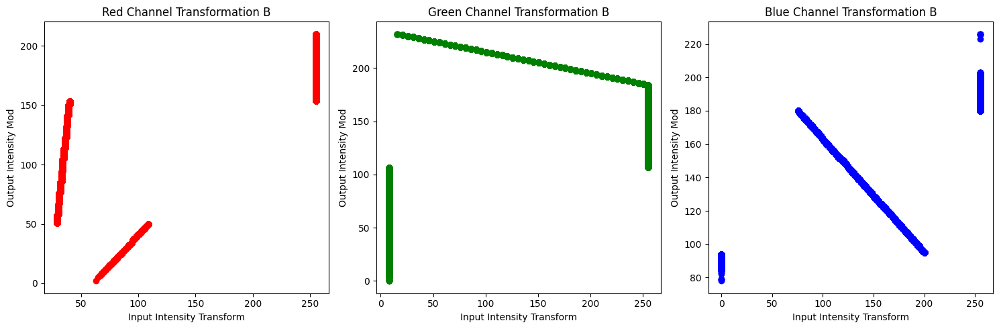

In [36]:
def q_4_6(img_arr, mod_arr, save_as, img):
    red_x = img_arr[:, :, 0].flatten()
    red_y = mod_arr[:, :, 0].flatten()

    green_x = img_arr[:, :, 1].flatten()
    green_y = mod_arr[:, :, 1].flatten()

    blue_x = img_arr[:, :, 2].flatten()
    blue_y = mod_arr[:, :, 2].flatten()

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].scatter(red_x, red_y, color='red')
    axes[0].set_title(f"Red Channel Transformation {img}")
    axes[0].set_xlabel("Input Intensity Transform")
    axes[0].set_ylabel("Output Intensity Mod")

    axes[1].scatter(green_x, green_y, color='green')
    axes[1].set_title(f"Green Channel Transformation {img}")
    axes[1].set_xlabel("Input Intensity Transform")
    axes[1].set_ylabel("Output Intensity Mod")

    axes[2].scatter(blue_x, blue_y, color='blue')
    axes[2].set_title(f"Blue Channel Transformation {img}")
    axes[2].set_xlabel("Input Intensity Transform")
    axes[2].set_ylabel("Output Intensity Mod")
    plt.tight_layout()
    plt.savefig(save_as)

q_4_6(transformed_img_A, mod_A, "./out_img/mod_transform_A.png", "A")
q_4_6(transformed_img_B, mod_B, "./out_img/mod_transform_B.png", "B")

## 4.7

We can see that the mod_transform of an image is a more smooth transformation similar to the given piecewise transformation function. No the transformation between transformed image and mod_transformed image cannot be called a filter, as there are multiple output values for the same input.